<a href="https://colab.research.google.com/github/ijga/506/blob/main/YOLOv8CustomObjectDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Fri Mar 29 21:52:10 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0              44W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install ultralytics==8.0.196

Install YOLOv8

In [ ]:
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
display.clear_output()
!yolo mode=checks

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 393, in entrypoint
    raise ValueError(f"Invalid 'mode={mode}'. Valid modes are {MODES}.\n{CLI_HELP_MSG}")
ValueError: Invalid 'mode=<module 'ultralytics.utils.checks' from '/usr/local/lib/python3.10/dist-packages/ultralytics/utils/checks.py'>'. Valid modes are ('train', 'val', 'predict', 'export', 'track', 'benchmark').

    Arguments received: ['yolo', 'mode=checks']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of ('detect', 'segment', 'classify', 'pose')
                MODE (required) is one of ('train', 'val', 'predict', 'export', 'track', 'benchmark')
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' that override defaults.
                    See all ARGS at https://d

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="tlC2glh48Ok5ZuGbLaX4")
project = rf.workspace("fifacoach").project("game_items")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...


In [ ]:
!yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=40

100% 49.7M/49.7M [00:00<00:00, 423MB/s]
New https://pypi.org/project/ultralytics/8.1.37 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/game_items-1/data.yaml, epochs=40, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=F

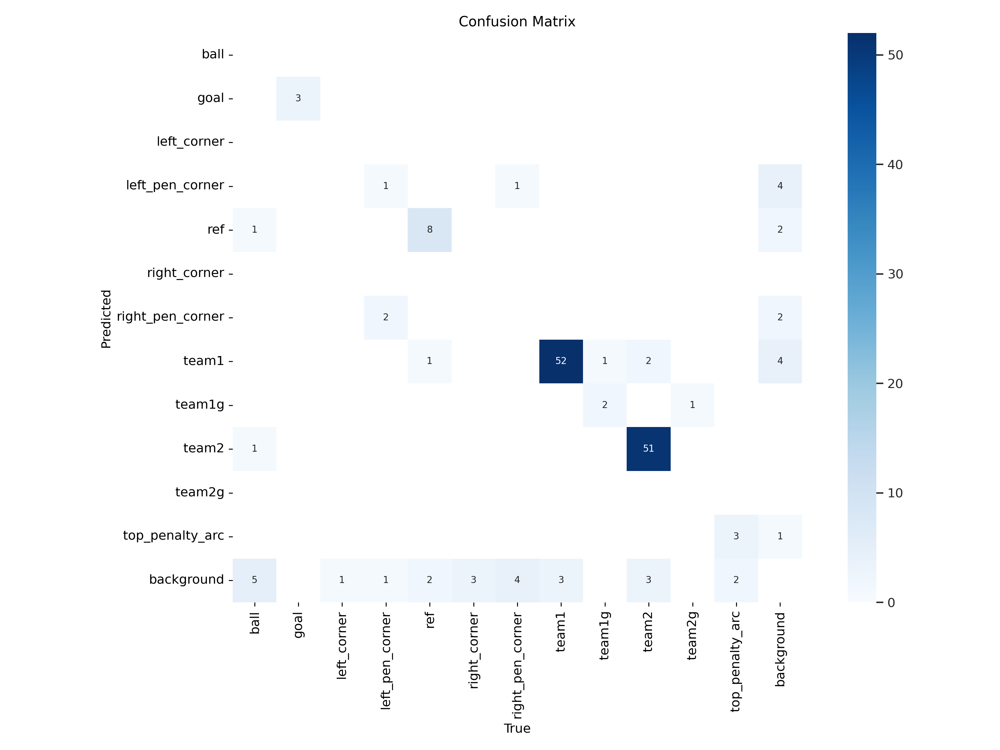

In [ ]:
Image(filename=f'/content/runs/detect/train/confusion_matrix.png', width=600)

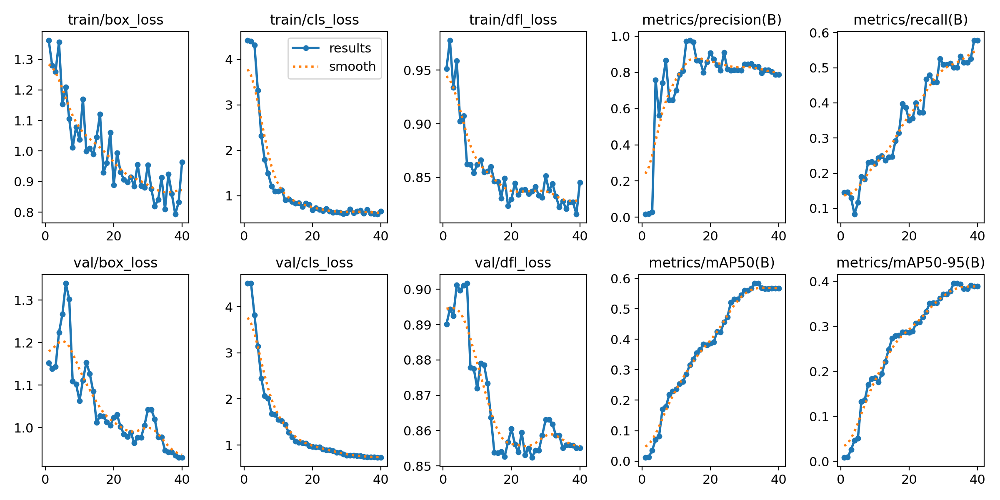

In [ ]:
Image(filename=f'/content/runs/detect/train/results.png', width=600)

In [ ]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25846708 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/game_items-1/valid/labels.cache... 7 images, 0 backgrounds, 0 corrupt: 100% 7/7 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 1/1 [00:01<00:00,  1.36s/it]
                   all          7        154      0.832      0.501      0.584        0.4
                  ball          7          7          1          0          0          0
                  goal          7          3      0.836          1      0.995      0.995
           left_corner          7          1          1          0          0          0
       left_pen_corner          7          4      0.729       0.75      0.778      0.297
                   ref          7         11      0.729      0.734      0.859      0.553
          right_corner          7       

In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml source=/content/game_items-1/valid/images

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25846708 parameters, 0 gradients, 78.7 GFLOPs

image 1/7 /content/game_items-1/valid/images/yt-cgDlmvU2sA4-0008_jpg.rf.74a77cdbf4fa2133ff728df36497645a.jpg: 384x640 1 left_pen_corner, 2 refs, 1 right_pen_corner, 11 team1s, 9 team2s, 1 top_penalty_arc, 142.7ms
image 2/7 /content/game_items-1/valid/images/yt-cgDlmvU2sA4-0019_jpg.rf.e2f6f1ac90a442ca835fb7a8ab2dfa67.jpg: 384x640 1 goal, 1 left_pen_corner, 2 refs, 7 team1s, 1 team1g, 5 team2s, 2 top_penalty_arcs, 10.6ms
image 3/7 /content/game_items-1/valid/images/yt-cgDlmvU2sA4-0021_jpg.rf.81f3d098e0587e9a9d6622c4a6231da1.jpg: 384x640 1 goal, 1 left_pen_corner, 1 ref, 7 team1s, 1 team1g, 6 team2s, 2 top_penalty_arcs, 10.2ms
image 4/7 /content/game_items-1/valid/images/yt-cgDlmvU2sA4-0027_jpg.rf.1df15f17005518c1c8e02bff58fdc54d.jpg: 384x640 1 left_pen_corner, 2 refs, 8 team1s, 10 team2s, 10.2ms
image 5/7 /c

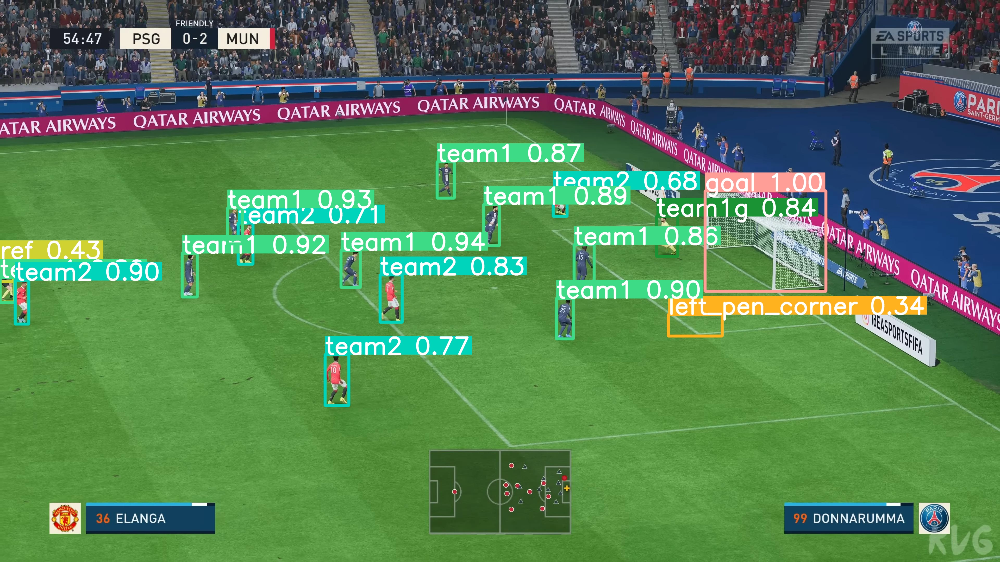

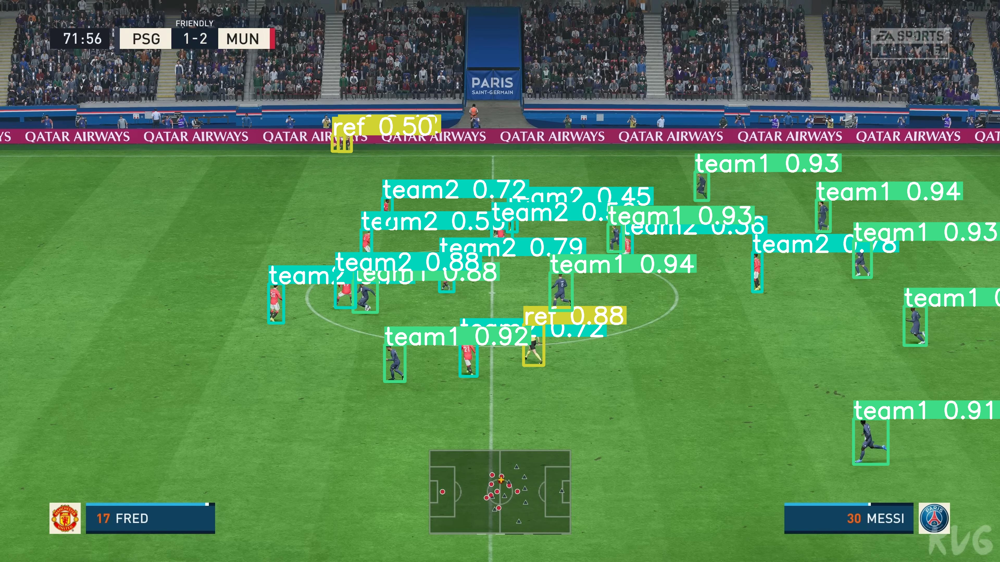

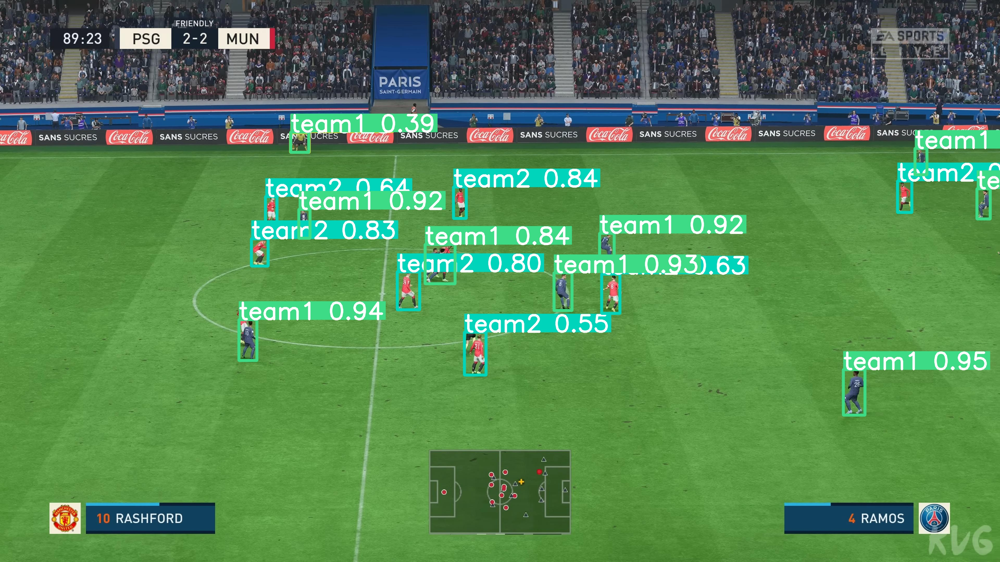

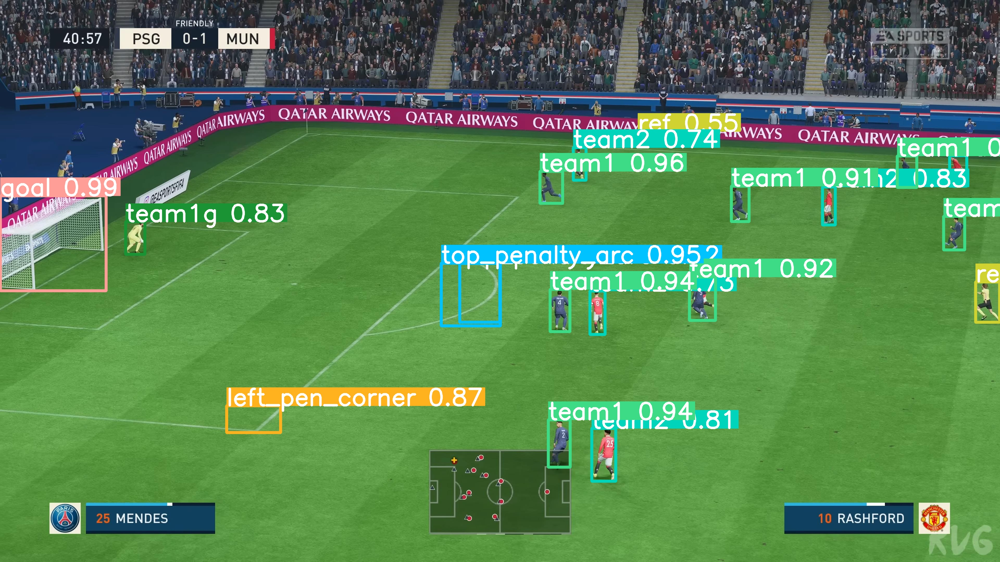

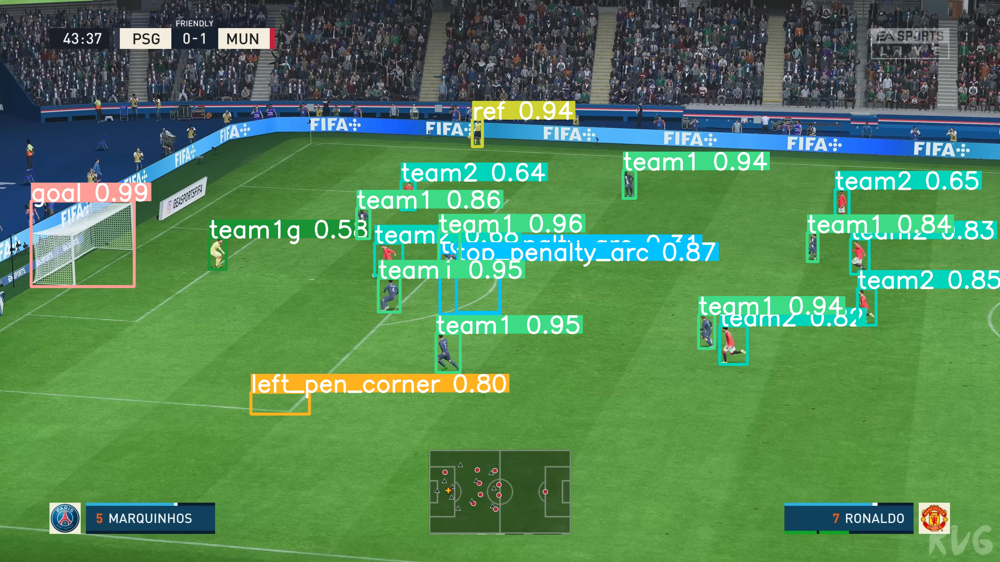

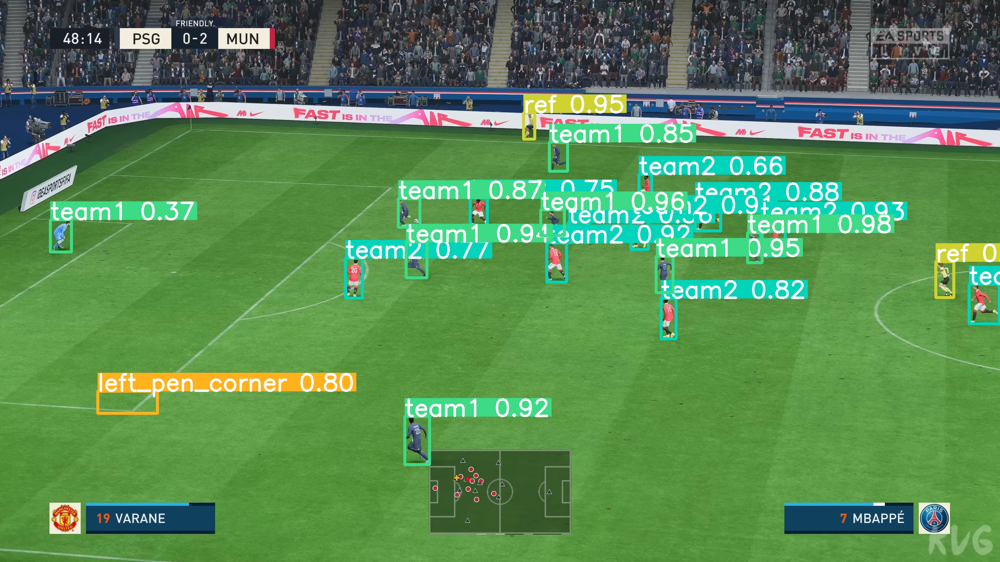

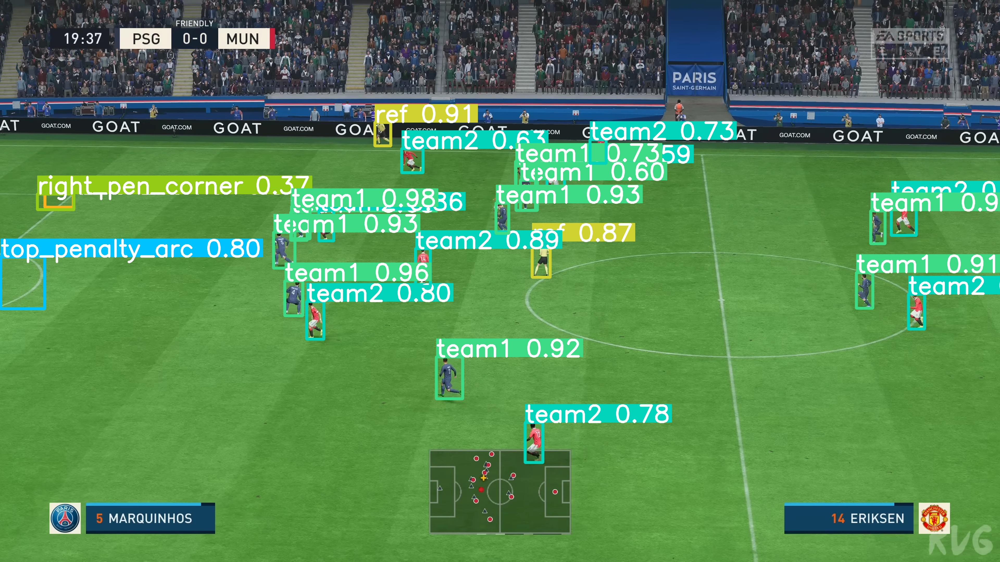

In [ ]:
import glob

from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
  display(Image(filename=image_path, height=600))
  print("\n")

# for image_path in glob.glob(f'/content/game_items-1/valid/images/*.jpg'):
#   display(Image(filename=image_path, height=600))
#   print("\n")